In [70]:
import json
import tqdm
from operator import itemgetter
import random
import matplotlib.pyplot as plt
import os
import cv2
import seaborn as sns
import numpy as np
import re
import pandas as pd
from collections import defaultdict
from prettytable import PrettyTable
from wordcloud import WordCloud, STOPWORDS

In [3]:
DATA_FOLDER = '../content'
IMAGE_FORMAT = '../content/%s/COCO_%s_%012d.jpg'

In [4]:
tTrainAnnotations = json.load(open(f'{DATA_FOLDER}/v2_mscoco_train2014_annotations.json', 'r'))
tTestAnnotations = json.load(open(f'{DATA_FOLDER}/v2_mscoco_val2014_annotations.json', 'r'))
tTrainQuestions = json.load(open(f'{DATA_FOLDER}/v2_OpenEnded_mscoco_train2014_questions.json', 'r'))
tTestQuestions = json.load(open(f'{DATA_FOLDER}/v2_OpenEnded_mscoco_val2014_questions.json', 'r'))

In [5]:
def GetAllAnswer(clAnswers):
    return ';'.join([cdAnswer['answer'] for cdAnswer in clAnswers])

In [6]:
GetAllAnswer(tTrainAnnotations['annotations'][1]['answers'])

'pitcher;catcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher'

In [7]:
tTrainAnnotations['annotations'][1]['image_id']

458752

In [8]:
tTrainQuestions['questions'][1]['question']

'What position is this man playing?'

In [9]:
tTrainAnnotations['annotations'][1]['multiple_choice_answer']

'pitcher'

In [10]:
GetAllAnswer(tTrainAnnotations['annotations'][1]['answers'])

'pitcher;catcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher'

In [11]:
# clData = []
# for iC in tqdm.tqdm(range(len(tTrainAnnotations['annotations']))):
#     sImagePath = IMAGE_FORMAT%('train2014', 'train2014', tTrainAnnotations['annotations'][iC]['image_id'])
#     sQuestion = tTrainQuestions['questions'][iC]['question']
#     sAns = tTrainAnnotations['annotations'][iC]['multiple_choice_answer']
#     clAnswers = GetAllAnswer(tTrainAnnotations['annotations'][iC]['answers'])
#     clData.append({'img_path': sImagePath, 'question': sQuestion, 'ans': sAns, 'answers': clAnswers})

# json.dump(clData, open(f'{DATA_FOLDER}/vqa_raw_train2014.json', 'w'))

In [12]:
# clData = []
# IMAGE_FORMAT = '../content/%s/COCO_%s_%012d.jpg'
# for iC in tqdm.tqdm(range(len(tTestAnnotations['annotations']))):
#     sImagePath = IMAGE_FORMAT%("val2014", "val2014", tTestAnnotations['annotations'][iC]['image_id'])
#     sQuestion = tTestQuestions['questions'][iC]['question']
#     sAns = tTestAnnotations['annotations'][iC]['multiple_choice_answer']
#     clAnswers = GetAllAnswer(tTestAnnotations['annotations'][iC]['answers'])
#     clData.append({'img_path': sImagePath, 'question': sQuestion, 'ans': sAns, 'answers': clAnswers})

# json.dump(clData, open(f'{DATA_FOLDER}/vqa_raw_test2014.json', 'w'))

In [13]:
tTrainData = json.load(open(f'{DATA_FOLDER}/vqa_raw_train2014.json', 'r'))
tTestData = json.load(open(f'{DATA_FOLDER}/vqa_raw_test2014.json', 'r'))

In [14]:
tTrainData

[{'img_path': '../content/train2014/COCO_train2014_000000458752.jpg',
  'question': 'What is this photo taken looking through?',
  'ans': 'net',
  'answers': 'net;net;net;netting;net;net;mesh;net;net;net'},
 {'img_path': '../content/train2014/COCO_train2014_000000458752.jpg',
  'question': 'What position is this man playing?',
  'ans': 'pitcher',
  'answers': 'pitcher;catcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher;pitcher'},
 {'img_path': '../content/train2014/COCO_train2014_000000458752.jpg',
  'question': 'What color is the players shirt?',
  'ans': 'orange',
  'answers': 'orange;orange;orange;orange;orange;orange;orange;orange;orange;orange'},
 {'img_path': '../content/train2014/COCO_train2014_000000458752.jpg',
  'question': 'Is this man a professional baseball player?',
  'ans': 'yes',
  'answers': 'yes;yes;yes;yes;yes;no;yes;yes;yes;yes'},
 {'img_path': '../content/train2014/COCO_train2014_000000262146.jpg',
  'question': 'What color is the snow?',
  'ans': 'whit

In [15]:
tTestData

[{'img_path': '../content/val2014/COCO_val2014_000000262148.jpg',
  'question': 'Where is he looking?',
  'ans': 'down',
  'answers': 'down;down;at table;skateboard;down;table;down;down;down;down'},
 {'img_path': '../content/val2014/COCO_val2014_000000262148.jpg',
  'question': 'What are the people in the background doing?',
  'ans': 'watching',
  'answers': 'spectating;watching;watching;watching;watching;watching;watching;watching;watching;watching'},
 {'img_path': '../content/val2014/COCO_val2014_000000262148.jpg',
  'question': 'What is he on top of?',
  'ans': 'picnic table',
  'answers': 'table;table;table;picnic table;picnic table;picnic table;picnic table;picnic table;skateboard;picnic table'},
 {'img_path': '../content/val2014/COCO_val2014_000000393225.jpg',
  'question': 'What website copyrighted the picture?',
  'ans': 'foodiebakercom',
  'answers': 'foodiebakercom;foodiebakercom;foodiebaker;foodiebakercom;foodiebakercom;http://foodiebakercom;foodiebakercom;foodiebakercom;foo

In [16]:
ques = tTrainData[0]['question']
ques

'What is this photo taken looking through?'

In [17]:
clQuestions = list(map(itemgetter('question'), tTrainData))
clAns = list(map(itemgetter('ans'), tTrainData))
clImagePaths = list(map(itemgetter('img_path'), tTrainData))

In [18]:
def DisplayImage(iIndex, clImagePaths, clQuestions, clAnswers):
    caImage = plt.imread(clImagePaths[iIndex])
    plt.figure()
    plt.title(f'Q: {clQuestions[iIndex]} \n A: {clAnswers[iIndex]}')
    plt.imshow(caImage)

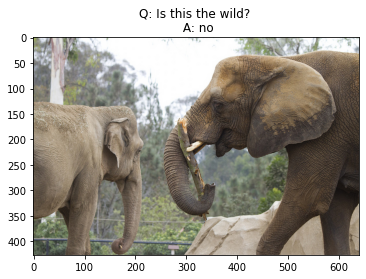

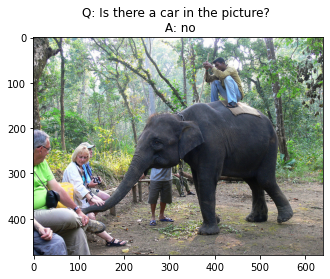

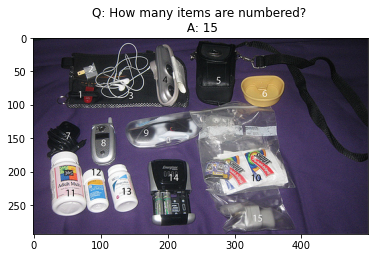

In [19]:
for iC in random.sample(range(0, len(clImagePaths)), 3):
    DisplayImage(iC, clImagePaths, clQuestions, clAns)

In [20]:
caImage = plt.imread(clImagePaths[0])

In [21]:
caImage.shape[2]

3

In [22]:
clImageShapes = []

for sImage in clImagePaths:
  caImage = cv2.imread(sImage)
  clImageShapes.append(caImage.shape)

In [23]:
for iC in clImageShapes:
    print(iC)

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(446, 640, 3)
(446, 640, 3)
(446, 640, 3)
(446, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 

(480, 640, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(403, 640, 3)
(403, 640, 3)
(403, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 383, 3)
(640, 383, 3)
(640, 383, 3)
(640, 383, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(222, 220, 3)
(222, 220, 3)
(222, 220, 3)
(222, 220, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(321, 500, 3)
(321, 500, 3)
(321, 500, 3)
(225, 193, 3)
(225, 193, 3)
(225, 193, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(623, 640, 3)
(623, 640, 3)
(623, 640, 3)
(623, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 

(332, 500, 3)
(332, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(240, 320, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(485, 483, 3)
(485, 483, 3)
(485, 483, 3)
(485, 483, 3)
(485, 483, 3)
(485, 483, 3)
(485, 483, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 511, 3)
(640, 511, 3)
(640, 511, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 

(600, 400, 3)
(600, 400, 3)
(600, 400, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(522, 640, 3)
(522, 640, 3)
(522, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 461, 3)
(640, 461, 3)
(640, 461, 3)
(500, 346, 3)
(500, 346, 3)
(500, 346, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(437, 583, 3)
(437, 583, 3)
(437, 583, 3)
(437, 583, 3)
(437, 583, 3)
(437, 583, 3)
(437, 583, 3)
(316, 640, 3)
(316, 640, 3)
(316, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(386, 640, 3)
(386, 640, 3)
(386, 640, 3)
(386, 640, 3)
(386, 640, 3)
(386, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 521, 3)
(640, 521, 3)
(640, 521, 3)
(640, 521, 3)
(480, 

(626, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(564, 640, 3)
(564, 640, 3)
(564, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(363, 640, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 

(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(413, 640, 3)
(413, 640, 3)
(413, 640, 3)
(413, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 

(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(346, 640, 3)
(346, 640, 3)
(346, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(427, 640, 3)
(427, 

(480, 640, 3)
(480, 640, 3)
(640, 538, 3)
(640, 538, 3)
(640, 538, 3)
(640, 538, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(461, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(590, 640, 3)
(590, 640, 3)
(590, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(303, 640, 3)
(303, 640, 3)
(303, 640, 3)
(303, 640, 3)
(303, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 521, 3)
(640, 521, 3)
(640, 521, 3)
(640, 521, 3)
(333, 500, 3)
(333, 

(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(353, 640, 3)
(353, 640, 3)
(353, 640, 3)
(353, 640, 3)
(353, 640, 3)
(353, 640, 3)
(353, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(416, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(344, 640, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(375, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(304, 640, 3)
(304, 640, 3)
(304, 640, 3)
(304, 640, 3)
(304, 640, 3)
(304, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 640, 3)
(279, 

(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(322, 500, 3)
(322, 500, 3)
(322, 500, 3)
(322, 500, 3)
(322, 500, 3)
(322, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(490, 640, 3)
(640, 555, 3)
(640, 555, 3)
(640, 555, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 444, 3)
(640, 444, 3)
(640, 

(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(640, 354, 3)
(640, 354, 3)
(640, 354, 3)
(640, 354, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(500, 332, 3)
(500, 332, 3)
(500, 332, 3)
(500, 332, 3)
(500, 332, 3)
(500, 332, 3)
(500, 332, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 357, 3)
(500, 357, 3)
(500, 357, 3)
(500, 357, 3)
(500, 357, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(500, 337, 3)
(500, 337, 3)
(500, 337, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(272, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 413, 3)
(640, 413, 3)
(640, 413, 3)
(640, 413, 3)
(412, 500, 3)
(412, 500, 3)
(412, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(454, 640, 3)
(454, 640, 3)
(454, 640, 3)
(454, 640, 3)
(454, 640, 3)
(640, 495, 3)
(640, 495, 3)
(640, 495, 3)
(640, 480, 3)
(640, 

(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(491, 640, 3)
(500, 336, 3)
(500, 336, 3)
(500, 336, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(486, 500, 3)
(486, 500, 3)
(486, 500, 3)
(486, 500, 3)
(486, 500, 3)
(486, 

(640, 640, 3)
(640, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(447, 640, 3)
(447, 640, 3)
(447, 640, 3)
(447, 640, 3)
(447, 640, 3)
(447, 640, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 462, 3)
(640, 462, 3)
(640, 462, 3)
(640, 462, 3)
(640, 439, 3)
(640, 439, 3)
(640, 439, 3)
(640, 439, 3)
(640, 439, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(444, 640, 3)
(444, 640, 3)
(444, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 

(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(383, 640, 3)
(383, 640, 3)
(383, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(640, 256, 3)
(640, 256, 3)
(640, 256, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(519, 640, 3)
(519, 640, 3)
(519, 640, 3)
(519, 640, 3)
(519, 640, 3)
(519, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 

(495, 640, 3)
(495, 640, 3)
(495, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 366, 3)
(640, 366, 3)
(640, 366, 3)
(640, 366, 3)
(640, 366, 3)
(640, 366, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 

(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(269, 500, 3)
(269, 500, 3)
(269, 500, 3)
(269, 500, 3)
(269, 500, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(327, 500, 3)
(327, 500, 3)
(327, 500, 3)
(327, 500, 3)
(327, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(469, 640, 3)
(469, 640, 3)
(469, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(474, 640, 3)
(474, 640, 3)
(474, 640, 3)
(474, 640, 3)
(474, 640, 3)
(474, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 

(351, 640, 3)
(351, 640, 3)
(351, 640, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(326, 640, 3)
(326, 640, 3)
(326, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 554, 3)
(640, 554, 3)
(640, 554, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 466, 3)
(640, 466, 3)
(640, 466, 3)
(640, 466, 3)
(600, 600, 3)
(600, 600, 3)
(600, 600, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(544, 640, 3)
(544, 640, 3)
(544, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 433, 3)
(640, 433, 3)
(640, 433, 3)
(640, 433, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(193, 640, 3)
(193, 640, 3)
(193, 640, 3)
(193, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(538, 640, 3)
(538, 640, 3)
(538, 640, 3)
(538, 640, 3)
(538, 640, 3)
(538, 640, 3)
(640, 640, 3)
(640, 

(424, 640, 3)
(309, 640, 3)
(309, 640, 3)
(309, 640, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 514, 3)
(640, 514, 3)
(640, 514, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(240, 359, 3)
(240, 359, 3)
(240, 359, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(272, 480, 3)
(272, 480, 3)
(272, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 484, 3)
(640, 484, 3)
(640, 484, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(478, 640, 3)
(478, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(427, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(342, 513, 3)
(342, 513, 3)
(342, 513, 3)
(342, 513, 3)
(433, 500, 3)
(433, 500, 3)
(433, 500, 3)
(640, 412, 3)
(640, 412, 3)
(640, 412, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(414, 640, 3)
(414, 640, 3)
(414, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(488, 640, 3)
(377, 500, 3)
(377, 500, 3)
(377, 500, 3)
(377, 500, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(640, 575, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(361, 640, 3)
(361, 640, 3)
(361, 640, 3)
(361, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(243, 500, 3)
(243, 500, 3)
(243, 500, 3)
(243, 500, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(452, 640, 3)
(452, 640, 3)
(452, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(529, 640, 3)
(529, 640, 3)
(529, 640, 3)
(500, 446, 3)
(500, 446, 3)
(500, 446, 3)
(500, 446, 3)
(500, 446, 3)
(500, 446, 3)
(500, 446, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 

(396, 640, 3)
(396, 640, 3)
(396, 640, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 334, 3)
(500, 334, 3)
(500, 334, 3)
(512, 640, 3)
(512, 640, 3)
(512, 640, 3)
(451, 640, 3)
(451, 640, 3)
(451, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 

(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(563, 640, 3)
(563, 640, 3)
(563, 640, 3)
(563, 640, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 474, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(348, 640, 3)
(348, 640, 3)
(348, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 534, 3)
(640, 534, 3)
(640, 534, 3)
(640, 534, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(500, 335, 3)
(500, 335, 3)
(500, 335, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(338, 640, 3)
(338, 640, 3)
(338, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(335, 500, 3)
(335, 

(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(500, 402, 3)
(469, 640, 3)
(469, 640, 3)
(469, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(364, 500, 3)
(364, 500, 3)
(364, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(330, 500, 3)
(330, 500, 3)
(330, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(451, 640, 3)
(451, 640, 3)
(451, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(615, 640, 3)
(615, 640, 3)
(615, 640, 3)
(615, 640, 3)
(615, 640, 3)
(615, 640, 3)
(615, 640, 3)
(615, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(341, 500, 3)
(341, 500, 3)
(341, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 

(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(638, 640, 3)
(638, 640, 3)
(638, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(334, 500, 3)
(334, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(373, 640, 3)
(373, 640, 3)
(373, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(579, 640, 3)
(579, 640, 3)
(579, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(372, 640, 3)
(372, 640, 3)
(372, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(361, 640, 3)
(361, 640, 3)
(361, 640, 3)
(640, 409, 3)
(640, 409, 3)
(640, 409, 3)
(640, 409, 3)
(478, 

(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(360, 538, 3)
(360, 538, 3)
(360, 538, 3)
(360, 538, 3)
(360, 538, 3)
(360, 538, 3)
(360, 538, 3)
(360, 538, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 489, 3)
(640, 489, 3)
(640, 489, 3)
(640, 489, 3)
(640, 489, 3)
(640, 489, 3)
(640, 489, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(229, 640, 3)
(229, 640, 3)
(229, 640, 3)
(229, 640, 3)
(229, 640, 3)
(229, 640, 3)
(229, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(378, 640, 3)
(378, 640, 3)
(378, 640, 3)
(378, 640, 3)
(640, 586, 3)
(640, 586, 3)
(640, 586, 3)
(640, 586, 3)
(640, 586, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 

(612, 612, 3)
(612, 612, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(640, 633, 3)
(640, 633, 3)
(640, 633, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(436, 640, 3)
(436, 640, 3)
(436, 640, 3)
(534, 640, 3)
(534, 640, 3)
(534, 640, 3)
(534, 640, 3)
(534, 640, 3)
(509, 640, 3)
(509, 

(426, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(468, 640, 3)
(468, 640, 3)
(468, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 376, 3)
(500, 376, 3)
(500, 376, 3)
(500, 376, 3)
(500, 376, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(427, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(448, 640, 3)
(448, 640, 3)
(448, 640, 3)
(640, 458, 3)
(640, 458, 3)
(640, 458, 3)
(640, 458, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(320, 640, 3)
(320, 640, 3)
(320, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(637, 640, 3)
(637, 640, 3)
(637, 640, 3)
(640, 436, 3)
(640, 436, 3)
(640, 436, 3)
(640, 436, 3)
(640, 436, 3)
(640, 436, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(493, 640, 3)
(493, 640, 3)
(493, 640, 3)
(493, 640, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(441, 640, 3)
(441, 640, 3)
(441, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 

(426, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(269, 500, 3)
(269, 500, 3)
(269, 500, 3)
(269, 500, 3)
(269, 

(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(381, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(342, 500, 3)
(449, 640, 3)
(449, 640, 3)
(449, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 

(415, 640, 3)
(415, 640, 3)
(168, 210, 3)
(168, 210, 3)
(168, 210, 3)
(168, 210, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(435, 640, 3)
(435, 640, 3)
(435, 640, 3)
(435, 640, 3)
(435, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 340, 3)
(640, 340, 3)
(640, 340, 3)
(640, 466, 3)
(640, 466, 3)
(640, 466, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(640, 421, 3)
(640, 421, 3)
(640, 421, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(394, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 457, 3)
(640, 

(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(415, 640, 3)
(415, 640, 3)
(415, 640, 3)
(415, 640, 3)
(415, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(499, 640, 3)
(499, 640, 3)
(499, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(294, 640, 3)
(294, 640, 3)
(294, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(375, 500, 3)
(375, 500, 3)
(375, 

(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(318, 640, 3)
(318, 640, 3)
(318, 640, 3)
(318, 640, 3)
(318, 640, 3)
(473, 640, 3)
(473, 640, 3)
(473, 640, 3)
(473, 640, 3)
(473, 640, 3)
(473, 640, 3)
(640, 469, 3)
(640, 469, 3)
(640, 469, 3)
(640, 469, 3)
(640, 469, 3)
(640, 469, 3)
(640, 469, 3)
(640, 

(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(475, 640, 3)
(475, 640, 3)
(475, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(500, 395, 3)
(500, 395, 3)
(500, 395, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(480, 

(485, 640, 3)
(485, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(547, 640, 3)
(547, 640, 3)
(547, 640, 3)
(547, 640, 3)
(547, 640, 3)
(547, 640, 3)
(547, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(500, 311, 3)
(500, 311, 3)
(500, 311, 3)
(500, 311, 3)
(500, 311, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(427, 

(640, 393, 3)
(640, 393, 3)
(443, 640, 3)
(443, 640, 3)
(443, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(489, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(384, 640, 3)
(384, 640, 3)
(384, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(543, 640, 3)
(543, 640, 3)
(543, 640, 3)
(543, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(458, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(335, 500, 3)
(335, 500, 3)
(335, 

(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(604, 640, 3)
(604, 640, 3)
(604, 640, 3)
(604, 640, 3)
(604, 640, 3)
(604, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(441, 640, 3)
(441, 640, 3)
(441, 640, 3)
(640, 503, 3)
(640, 503, 3)
(640, 503, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(500, 394, 3)
(500, 394, 3)
(500, 394, 3)
(500, 394, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(321, 500, 3)
(321, 500, 3)
(321, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 

(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(539, 640, 3)
(539, 640, 3)
(539, 640, 3)
(539, 640, 3)
(539, 640, 3)
(539, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(450, 600, 3)
(450, 600, 3)
(450, 600, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 423, 3)
(640, 423, 3)
(640, 423, 3)
(204, 640, 3)
(204, 640, 3)
(204, 640, 3)
(204, 

(426, 640, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 456, 3)
(640, 456, 3)
(640, 456, 3)
(640, 456, 3)
(640, 456, 3)
(640, 456, 3)
(358, 640, 3)
(358, 640, 3)
(358, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(500, 334, 3)
(500, 334, 3)
(500, 334, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 

(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 

(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(152, 640, 3)
(152, 640, 3)
(152, 640, 3)
(152, 640, 3)
(152, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(640, 640, 3)
(422, 640, 3)
(422, 640, 3)
(422, 640, 3)
(422, 640, 3)
(396, 640, 3)
(396, 640, 3)
(396, 640, 3)
(396, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(477, 640, 3)
(477, 640, 3)
(477, 640, 3)
(477, 640, 3)
(477, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 431, 3)
(640, 431, 3)
(640, 431, 3)
(640, 431, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 462, 3)
(640, 462, 3)
(640, 462, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(500, 363, 3)
(500, 363, 3)
(500, 363, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(427, 640, 3)
(427, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 408, 3)
(640, 408, 3)
(640, 408, 3)
(640, 408, 3)
(640, 408, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(464, 640, 3)
(464, 640, 3)
(464, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 

(309, 500, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(249, 640, 3)
(249, 640, 3)
(249, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 358, 3)
(640, 358, 3)
(640, 358, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(462, 312, 3)
(462, 312, 3)
(462, 312, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(294, 500, 3)
(294, 500, 3)
(294, 500, 3)
(640, 480, 3)
(640, 

(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(486, 640, 3)
(320, 640, 3)
(320, 640, 3)
(320, 640, 3)
(320, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 622, 3)
(640, 622, 3)
(640, 622, 3)
(640, 622, 3)
(640, 409, 3)
(640, 409, 3)
(640, 409, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(404, 640, 3)
(404, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(470, 640, 3)
(470, 640, 3)
(470, 640, 3)
(470, 640, 3)
(470, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 534, 3)
(640, 534, 3)
(640, 534, 3)
(640, 534, 3)
(640, 534, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(349, 500, 3)
(349, 500, 3)
(349, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(392, 640, 3)
(392, 640, 3)
(392, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(176, 500, 3)
(176, 500, 3)
(176, 500, 3)
(176, 500, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(463, 640, 3)
(463, 640, 3)
(463, 640, 3)
(463, 640, 3)
(463, 640, 3)
(512, 640, 3)
(512, 640, 3)
(512, 640, 3)
(597, 640, 3)
(597, 640, 3)
(597, 640, 3)
(597, 640, 3)
(236, 640, 3)
(236, 640, 3)
(236, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(383, 

(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 492, 3)
(640, 492, 3)
(640, 492, 3)
(640, 492, 3)
(640, 492, 3)
(640, 492, 3)
(640, 492, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(419, 500, 3)
(419, 500, 3)
(419, 500, 3)
(419, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 

(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(640, 639, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(500, 341, 3)
(500, 341, 3)
(500, 341, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(450, 640, 3)
(450, 640, 3)
(450, 640, 3)
(450, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(428, 640, 3)
(428, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(456, 640, 3)
(392, 640, 3)
(392, 640, 3)
(392, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 

(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(281, 500, 3)
(281, 500, 3)
(281, 500, 3)
(281, 500, 3)
(281, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 375, 3)
(500, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(298, 448, 3)
(298, 448, 3)
(298, 448, 3)
(640, 419, 3)
(640, 419, 3)
(640, 419, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(470, 640, 3)
(470, 640, 3)
(470, 640, 3)
(500, 374, 3)
(500, 374, 3)
(500, 374, 3)
(500, 374, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(494, 640, 3)
(494, 640, 3)
(494, 640, 3)
(494, 640, 3)
(494, 640, 3)
(494, 640, 3)
(494, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(499, 640, 3)
(499, 640, 3)
(499, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(402, 640, 3)
(402, 640, 3)
(402, 640, 3)
(402, 640, 3)
(402, 640, 3)
(432, 640, 3)
(432, 640, 3)
(432, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(396, 640, 3)
(396, 640, 3)
(396, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(334, 500, 3)
(334, 500, 3)
(334, 500, 3)
(334, 500, 3)
(334, 500, 3)
(480, 

(345, 500, 3)
(345, 500, 3)
(345, 500, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(406, 640, 3)
(406, 640, 3)
(406, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(523, 640, 3)
(523, 640, 3)
(523, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 

(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(640, 583, 3)
(640, 583, 3)
(640, 583, 3)
(640, 583, 3)
(566, 480, 3)
(566, 480, 3)
(566, 480, 3)
(500, 447, 3)
(500, 447, 3)
(500, 447, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(442, 640, 3)
(442, 640, 3)
(442, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(478, 

(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(366, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(331, 500, 3)
(331, 500, 3)
(331, 500, 3)
(331, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(385, 640, 3)
(385, 640, 3)
(385, 640, 3)
(385, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(484, 500, 3)
(484, 500, 3)
(484, 500, 3)
(484, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(600, 449, 3)
(600, 449, 3)
(600, 449, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(427, 

(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 

(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(457, 640, 3)
(307, 500, 3)
(307, 500, 3)
(307, 500, 3)
(307, 500, 3)
(307, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(420, 640, 3)
(420, 640, 3)
(420, 640, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 431, 3)
(640, 431, 3)
(640, 431, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 425, 3)
(500, 425, 3)
(500, 425, 3)
(443, 640, 3)
(443, 640, 3)
(443, 640, 3)
(443, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 463, 3)
(640, 463, 3)
(640, 463, 3)
(640, 463, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 

(360, 480, 3)
(360, 480, 3)
(360, 480, 3)
(360, 480, 3)
(360, 480, 3)
(360, 480, 3)
(360, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 450, 3)
(640, 450, 3)
(640, 450, 3)
(640, 450, 3)
(640, 450, 3)
(640, 450, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(401, 640, 3)
(401, 640, 3)
(401, 640, 3)
(401, 640, 3)
(401, 640, 3)
(401, 640, 3)
(401, 

(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 447, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 640, 3)
(508, 

(640, 425, 3)
(640, 425, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 505, 3)
(640, 505, 3)
(640, 505, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(296, 228, 3)
(296, 228, 3)
(296, 228, 3)
(399, 640, 3)
(399, 640, 3)
(399, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(434, 640, 3)
(434, 640, 3)
(434, 640, 3)
(434, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 406, 3)
(640, 406, 3)
(640, 406, 3)
(640, 406, 3)
(640, 

(640, 428, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 499, 3)
(500, 499, 3)
(500, 499, 3)
(373, 500, 3)
(373, 500, 3)
(373, 500, 3)
(373, 500, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(640, 426, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 

(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(265, 500, 3)
(265, 500, 3)
(265, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(506, 640, 3)
(506, 640, 3)
(506, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 640, 3)
(500, 640, 3)
(500, 640, 3)
(500, 640, 3)
(500, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(321, 640, 3)
(321, 640, 3)
(321, 640, 3)
(500, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(398, 640, 3)
(398, 640, 3)
(398, 640, 3)
(398, 640, 3)
(398, 640, 3)
(398, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(512, 640, 3)
(512, 640, 3)
(512, 640, 3)
(512, 640, 3)
(512, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 

(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 442, 3)
(640, 442, 3)
(640, 442, 3)
(640, 442, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(500, 400, 3)
(500, 400, 3)
(500, 400, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(433, 640, 3)
(433, 640, 3)
(433, 640, 3)
(433, 640, 3)
(433, 640, 3)
(433, 640, 3)
(433, 640, 3)
(433, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(595, 640, 3)
(595, 640, 3)
(595, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(480, 

(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(435, 640, 3)
(435, 640, 3)
(435, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(640, 417, 3)
(640, 417, 3)
(640, 417, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(408, 640, 3)
(408, 640, 3)
(408, 640, 3)
(408, 640, 3)
(640, 473, 3)
(640, 473, 3)
(640, 473, 3)
(640, 473, 3)
(450, 600, 3)
(450, 600, 3)
(450, 600, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 640, 3)
(640, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 

(432, 287, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(450, 640, 3)
(450, 640, 3)
(450, 640, 3)
(450, 640, 3)
(450, 640, 3)
(450, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(515, 640, 3)
(515, 640, 3)
(515, 640, 3)
(638, 640, 3)
(638, 640, 3)
(638, 640, 3)
(638, 640, 3)
(638, 640, 3)
(638, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 

(481, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(465, 500, 3)
(465, 500, 3)
(465, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(383, 640, 3)
(383, 640, 3)
(383, 640, 3)
(383, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(466, 640, 3)
(466, 640, 3)
(466, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(325, 500, 3)
(325, 500, 3)
(325, 500, 3)
(325, 500, 3)
(325, 500, 3)
(325, 500, 3)
(325, 500, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(384, 640, 3)
(384, 640, 3)
(384, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(359, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(418, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(422, 

(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(356, 500, 3)
(356, 500, 3)
(356, 500, 3)
(524, 640, 3)
(524, 640, 3)
(524, 640, 3)
(524, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(549, 640, 3)
(549, 640, 3)
(549, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 

(640, 631, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(429, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(477, 640, 3)
(477, 640, 3)
(477, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(362, 500, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(640, 434, 3)
(640, 434, 3)
(640, 434, 3)
(640, 434, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 432, 3)
(640, 432, 3)
(640, 432, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(413, 640, 3)
(413, 640, 3)
(413, 640, 3)
(413, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 428, 3)
(640, 428, 3)
(640, 428, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(405, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(283, 500, 3)
(283, 500, 3)
(283, 500, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(357, 500, 3)
(357, 500, 3)
(357, 500, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(640, 479, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 640, 3)
(497, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(495, 640, 3)
(495, 640, 3)
(495, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(285, 188, 3)
(285, 188, 3)
(285, 188, 3)
(640, 396, 3)
(640, 396, 3)
(640, 396, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(400, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 464, 3)
(640, 464, 3)
(640, 464, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(481, 640, 3)
(481, 640, 3)
(481, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 603, 3)
(640, 603, 3)
(640, 603, 3)
(640, 603, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(640, 556, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(512, 640, 3)
(512, 

(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 640, 3)
(340, 

(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(419, 640, 3)
(419, 640, 3)
(419, 640, 3)
(619, 640, 3)
(619, 640, 3)
(619, 640, 3)
(640, 452, 3)
(640, 452, 3)
(640, 452, 3)
(320, 640, 3)
(320, 640, 3)
(320, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 465, 3)
(640, 465, 3)
(640, 465, 3)
(640, 465, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 

(640, 480, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(640, 431, 3)
(640, 431, 3)
(640, 431, 3)
(640, 431, 3)
(622, 640, 3)
(622, 640, 3)
(622, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(376, 640, 3)
(376, 640, 3)
(376, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(500, 385, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(427, 640, 3)
(640, 429, 3)
(640, 429, 3)
(640, 429, 3)
(512, 640, 3)
(512, 640, 3)
(512, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(446, 640, 3)
(446, 640, 3)
(446, 640, 3)
(446, 640, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(284, 640, 3)
(284, 640, 3)
(284, 640, 3)
(438, 640, 3)
(438, 640, 3)
(438, 640, 3)
(438, 640, 3)
(438, 640, 3)
(438, 640, 3)
(438, 640, 3)
(438, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(640, 624, 3)
(640, 624, 3)
(640, 624, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(363, 599, 3)
(363, 599, 3)
(363, 599, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 594, 3)
(640, 594, 3)
(640, 594, 3)
(640, 531, 3)
(640, 531, 3)
(640, 531, 3)
(640, 531, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 

(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(390, 500, 3)
(390, 500, 3)
(390, 500, 3)
(390, 500, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(332, 500, 3)
(544, 640, 3)
(544, 640, 3)
(544, 

(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(431, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(400, 500, 3)
(400, 500, 3)
(400, 500, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(412, 640, 3)
(412, 640, 3)
(412, 640, 3)
(412, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 

(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 476, 3)
(640, 476, 3)
(640, 476, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(401, 640, 3)
(401, 640, 3)
(401, 640, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(581, 640, 3)
(581, 640, 3)
(581, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 384, 3)
(500, 384, 3)
(500, 384, 3)
(640, 426, 3)
(640, 426, 3)
(640, 426, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(478, 

(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(640, 360, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(374, 500, 3)
(374, 500, 3)
(374, 500, 3)
(374, 500, 3)
(374, 500, 3)
(374, 500, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(479, 

(480, 640, 3)
(500, 346, 3)
(500, 346, 3)
(500, 346, 3)
(500, 346, 3)
(500, 346, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(548, 640, 3)
(548, 640, 3)
(548, 640, 3)
(640, 578, 3)
(640, 578, 3)
(640, 578, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(409, 640, 3)
(409, 640, 3)
(409, 640, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(640, 512, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(500, 333, 3)
(500, 375, 3)
(500, 375, 3)
(500, 

(428, 640, 3)
(640, 453, 3)
(640, 453, 3)
(640, 453, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(482, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(424, 640, 3)
(424, 640, 3)
(424, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(221, 640, 3)
(221, 640, 3)
(221, 640, 3)
(221, 640, 3)
(221, 640, 3)
(221, 640, 3)
(221, 640, 3)
(408, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 466, 3)
(640, 466, 3)
(640, 466, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 593, 3)
(640, 593, 3)
(640, 593, 3)
(640, 593, 3)
(640, 593, 3)
(640, 593, 3)
(640, 

(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(483, 640, 3)
(483, 640, 3)
(483, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(640, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(360, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(335, 500, 3)
(335, 500, 3)
(335, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 425, 3)
(640, 425, 3)
(640, 425, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(500, 335, 3)
(500, 335, 3)
(500, 335, 3)
(500, 335, 3)
(500, 335, 3)
(500, 335, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(423, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(640, 431, 3)
(640, 431, 3)
(640, 431, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 640, 3)
(578, 

(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(640, 480, 3)
(333, 500, 3)
(333, 500, 3)
(333, 500, 3)
(479, 640, 3)
(479, 640, 3)
(479, 640, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(500, 375, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 427, 3)
(640, 424, 3)
(640, 424, 3)
(640, 424, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(640, 478, 3)
(640, 478, 3)
(640, 478, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(612, 612, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(440, 640, 3)
(440, 640, 3)
(440, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(500, 

(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(500, 254, 3)
(500, 254, 3)
(500, 254, 3)
(500, 254, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(425, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(430, 640, 3)
(640, 462, 3)
(640, 462, 3)
(640, 462, 3)
(640, 462, 3)
(640, 462, 3)
(426, 

(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(478, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(352, 500, 3)
(352, 500, 3)
(352, 500, 3)
(640, 383, 3)
(640, 383, 3)
(640, 383, 3)
(640, 383, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(375, 500, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(428, 640, 3)
(428, 640, 3)
(428, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(427, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(439, 640, 3)
(439, 640, 3)
(439, 640, 3)
(439, 640, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(238, 320, 3)
(640, 

In [24]:
clHeights = list(map(itemgetter(0), clImageShapes)) 
clWidths = list(map(itemgetter(1), clImageShapes)) 
clChannels = list(map(itemgetter(2), clImageShapes))

C:\Users\vbui\Documents\applications\anaconda\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\vbui\Documents\applications\anaconda\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


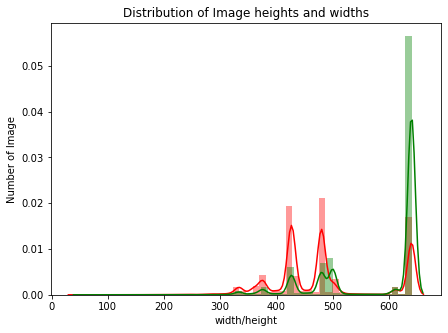

In [25]:
plt.figure(figsize=(7,5))
sns.distplot(clHeights, color='red')
sns.distplot(clWidths, color='green')
plt.title('Distribution of Image heights and widths')
plt.xlabel('width/height')
plt.ylabel('Number of Image')
plt.show()

In [26]:
print("MAX Height: {}, MIN Height: {}, MEAN Height: {}".format(max(clHeights), min(clHeights), np.round(np.mean(clHeights),2)))
print("MAX Width: {}, MIN Width: {}, MEAN Width: {}".format(max(clWidths), min(clWidths), np.round(np.mean(clWidths),2)))

MAX Height: 640, MIN Height: 51, MEAN Height: 482.51
MAX Width: 640, MIN Width: 59, MEAN Width: 580.63


In [27]:
clIdxQuestionsSample = random.sample(range(0, len(clQuestions)), 20)
for iIndex in clIdxQuestionsSample:
  print(clQuestions[iIndex])
  print('_'*50)

How many things can a person plug in?
__________________________________________________
What color is the girl's shirt?
__________________________________________________
Is this boy good at snowboarding?
__________________________________________________
What is the shop selling?
__________________________________________________
Where are the stems with leaves?
__________________________________________________
Are both sheep's ears tagged?
__________________________________________________
How many bears are fully visible?
__________________________________________________
How many containers are shown?
__________________________________________________
Is this man wearing a yellow shirt?
__________________________________________________
Is he a good player?
__________________________________________________
What are the young men doing in the photo?
__________________________________________________
What is on the refrigerator?
__________________________________________________
W

In [28]:
clQuestionLengths = []
clWords = []
for sQuestion in tqdm.tqdm(clQuestions):
    # print(i.split(" "))
    clQuestionLengths.append(len(sQuestion.split(" ")))
    for sWord in sQuestion.split(" "):
        clWords.append(sWord)
csWords = set(clWords)

100%|██████████| 443757/443757 [00:00<00:00, 517295.59it/s]


In [29]:
csWords

{'',
 'lowrider?',
 'boars',
 'spaghetti?',
 '"riding"',
 'stairs',
 'presentable?',
 'using',
 'scheme',
 'captive?',
 'pumps',
 'Picture?',
 'Mercedes?',
 'crosswalk',
 'making?',
 'dating?',
 "cleaner's",
 'finish',
 'drops',
 'study',
 'rained?',
 'gesture?',
 'awnings',
 'Railway',
 'carbonated',
 'up.',
 'unbuttoned?',
 'plow',
 'accordingly',
 'slash',
 'aprons?',
 'ambient',
 'peeing',
 'paid',
 'anatomy',
 'fresher',
 'fingertips?',
 'barb',
 'frustrated?',
 'dishwasher',
 'thimbles?',
 'crowded?',
 'pumpkin?',
 'Nikes',
 'sprinkle?',
 'jumpsuit?',
 'pizzeria?',
 'elegant?',
 'platters?',
 'profiles?',
 'branded?',
 'dialed?',
 'napkin/towel?',
 'wetsuits?',
 'my',
 'gluten-free?',
 'font?',
 "'STOP'?",
 'Fuji',
 'living?',
 'world-class',
 "don't?",
 'ladder',
 'heating/cooling',
 'rolled',
 'deflated?',
 'crackers',
 'opposites',
 'cables',
 'raising',
 'usually?',
 'lion',
 'mats?',
 'pointy?',
 'Fred?',
 'Schofield',
 'whities"?',
 '5',
 'rocket?',
 'gridlock?',
 'from',
 

C:\Users\vbui\Documents\applications\anaconda\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


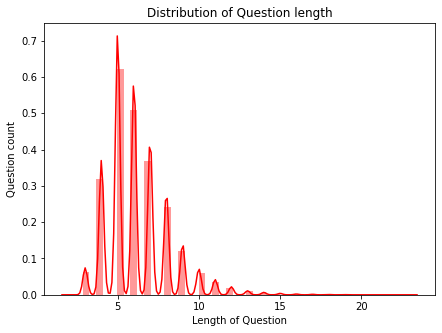

In [30]:
plt.figure(figsize=(7,5))
sns.distplot(clQuestionLengths, color='red')
plt.title('Distribution of Question length')
plt.xlabel('Length of Question')
plt.ylabel('Question count')
plt.show()

In [31]:
print('BEFORE DATA CLEANING')
print('-'*35)
print("A sentence has max words:",max(clQuestionLengths))
print("A sentence has min words:",min(clQuestionLengths))
print('A sentence has average words:',int(sum(clQuestionLengths)/len(clQuestionLengths)))
print('There are total',len(csWords),'unique words')

BEFORE DATA CLEANING
-----------------------------------
A sentence has max words: 23
A sentence has min words: 2
A sentence has average words: 6
There are total 22226 unique words


In [32]:
ALPHABET = 'qwertyuiopasdfghjklzxcvbnmQWERTYUIOPASDFGHJKLZXCVBNM0123456789'

In [33]:
clLettersNotAlphatbet = []
for sWord in csWords:
    for sLetter in ALPHABET:
        sWord = sWord.replace(sLetter,'')
        #print(k)
    clLettersNotAlphatbet.append(sWord)

In [34]:
#merge all the non-alphabet characters in 'list_1' to one single list 'set_1'
sLettersNotAlphatbet = ''
for sLetters in clLettersNotAlphatbet:
    sLettersNotAlphatbet += sLetters
csLettersNotAlphabet = set(sLettersNotAlphatbet)

In [35]:
len(csLettersNotAlphabet)

21

In [36]:
#concatanate all the special symbols to a single string 'SYMBOLS_TO_REMOVE'
SYMBOLS_TO_REMOVE = ''.join(sLetter for sLetter in csLettersNotAlphabet)
print('There are total',len(SYMBOLS_TO_REMOVE),'non-alphabet characters (including digits) in our corpus.')

There are total 21 non-alphabet characters (including digits) in our corpus.


In [37]:
SYMBOLS_TO_REMOVE

'`\')%:#&$./"*?-_!^(+;,'

## Data Cleaning

In [38]:
# contraction mappings
CONTRACTIONS = {"aint": "ain't", "arent": "aren't", "cant": "can't", 
                "couldve": "could've", "couldnt": "couldn't", "couldn'tve": "couldn't've", "couldnt've": "couldn't've", 
                "didnt": "didn't", "doesnt": "doesn't", "dont": "don't", 
                "hadnt": "hadn't", "hadnt've": "hadn't've", "hadn'tve": "hadn't've", "hasnt": "hasn't", "havent": "haven't", 
                "hed": "he'd", "hed've": "he'd've", "he'dve": "he'd've", "hes": "he's", 
                "howd": "how'd", "howll": "how'll", "hows": "how's", 
                "Id've": "I'd've", "I'dve": "I'd've", "Im": "I'm", "Ive": "I've", 
                "isnt": "isn't", "itd": "it'd", "itd've": "it'd've", "it'dve": "it'd've", "itll": "it'll", 
                "let's": "let's", 
                "maam": "ma'am", 
                "mightnt": "mightn't", "mightnt've": "mightn't've", "mightn'tve": "mightn't've", "mightve": "might've", 
                "mustnt": "mustn't", "mustve": "must've", 
                "neednt": "needn't", "notve": "not've", 
                "oclock": "o'clock", 
                "oughtnt": "oughtn't", 
                "ow's'at": "'ow's'at", "'ows'at": "'ow's'at", "'ow'sat": "'ow's'at", 
                "shant": "shan't", "shed've": "she'd've", "she'dve": "she'd've", "she's": "she's", 
                "shouldve": "should've", "shouldnt": "shouldn't", "shouldnt've": "shouldn't've", "shouldn'tve": "shouldn't've", 
                "somebody'd": "somebodyd", "somebodyd've": "somebody'd've", "somebody'dve": "somebody'd've", 
                "somebodyll": "somebody'll", "somebodys": "somebody's", "someoned": "someone'd", "someoned've": "someone'd've", 
                "someone'dve": "someone'd've", "someonell": "someone'll", "someones": "someone's", "somethingd": "something'd", 
                "somethingd've": "something'd've", "something'dve": "something'd've", "somethingll": "something'll", 
                "thats": "that's", 
                "thered": "there'd", "thered've": "there'd've", "there'dve": "there'd've", "therere": "there're", 
                "theres": "there's", 
                "theyd": "they'd", "theyd've": "they'd've", "they'dve": "they'd've", "theyll": "they'll", 
                "theyre": "they're", "theyve": "they've", 
                "twas": "'twas", "wasnt": "wasn't", 
                "wed've": "we'd've", "we'dve": "we'd've", 
                "weve": "we've", "werent": "weren't", 
                "whatll": "what'll", "whatre": "what're", "whats": "what's", "whatve": "what've", 
                "whens": "when's", 
                "whered": "where'd", "where's": "where is", "whereve": "where've", 
                "whod": "who'd", "whod've": "who'd've", "who'dve": "who'd've", "wholl": "who'll", "whos": "who's", 
                "whove": "who've", 
                "whyll": "why'll", "whyre": "why're", "whys": "why's", 
                "wont": "won't", 
                "wouldve": "would've", "wouldnt": "wouldn't", "wouldnt've": "wouldn't've", "wouldn'tve": "wouldn't've", 
                "yall": "y'all", "yall'll": "y'all'll", "y'allll": "y'all'll", "yall'd've": "y'all'd've", 
                "y'alld've": "y'all'd've", "y'all'dve": "y'all'd've", 
                "youd": "you'd", "youd've": "you'd've", "you'dve": "you'd've", 
                "youll": "you'll", "youre": "you're", "youve": "you've"}

In [39]:
# list of punctuations to remove
PUNCTUATIONS = [';', r"/", '[', ']', '"', '{', '}',
                '(', ')', '=', '+', '\\', '_', '-',
                '*', ':', '^', '%', '$', '#', '&',
                '>', '<', '@', '`', ',', '?', '!']

In [40]:
def ProcessSentence(sSentence):
    """
    Cleans a given raw sentence

    Input:
        sentence: a raw sentence

    Returns:
        Returns the cleaned version of the sentence
    """
    # remove the character ".", except from floating numbers
    periodStrip  = re.compile("(?!<=\d)(\.)(?!\d)")
    # remove any "," between digits, eg: 5,6
    commaStrip   = re.compile("(\d)(\,)(\d)")

    # replace new line with a white space
    inText = sSentence.replace('\n', ' ')
    # replace multiple white space with single white space
    inText = inText.replace('\t', ' ')
    inText = inText.strip()
    outText = inText
    for p in PUNCTUATIONS:
        if (p + ' ' in inText or ' ' + p in inText) or \
           (re.search(commaStrip, inText) != None):
            outText = outText.replace(p, '')
        else:
            outText = outText.replace(p, ' ')
    outText = periodStrip.sub("", outText, re.UNICODE)
    outText = outText.lower().split()
    for wordId, word in enumerate(outText):
        if word in CONTRACTIONS:
            outText[wordId] = CONTRACTIONS[word]
    outText = ' '.join(outText)
    return outText

In [41]:
datas = ["Is the snow in this picture probably natural , or probably man-made ?", 
         "What color is the woman's shirt?",
         "Where's the man ... looking at?"]

for data in datas:
  print('BEFORE: ', data)
  temp = ProcessSentence(data)
  print('AFTER : ', temp)
  print('-'*50)

BEFORE:  Is the snow in this picture probably natural , or probably man-made ?
AFTER :  is the snow in this picture probably natural or probably man made
--------------------------------------------------
BEFORE:  What color is the woman's shirt?
AFTER :  what color is the woman's shirt
--------------------------------------------------
BEFORE:  Where's the man ... looking at?
AFTER :  where is the man looking at
--------------------------------------------------


In [42]:
dfQuestionsProcessed = pd.Series(clQuestions).apply(ProcessSentence)

In [43]:
clFirstWord = []
for sQuestion in tqdm.tqdm(dfQuestionsProcessed):
  clFirstWord.append(sQuestion.split()[0].lower())

100%|██████████| 443757/443757 [00:00<00:00, 1037506.13it/s]


In [44]:
print('There are ',len(set(clFirstWord)),' type of questions in the dataset.')

There are  271  type of questions in the dataset.


In [45]:
cdQuestionFreq = defaultdict(int)
for sKey in list(clFirstWord):
		cdQuestionFreq[sKey] += 1

cdSortedFreq = sorted(cdQuestionFreq.items(), key=itemgetter(1), reverse=True)[0: 10]
ctTopQuestion, ctTopFreq = zip(*cdSortedFreq)

In [47]:
x = PrettyTable()
x = PrettyTable(["Question Type", "Question Count", "Coverage"])

for i in range(10):
    clRow = []
    clRow.append(ctTopQuestion[i])
    clRow.append(ctTopFreq[i])
    clRow.append(np.round((ctTopFreq[i]/sum(ctTopFreq))*100, 2))
    x.add_row(clRow)

print(x)

+---------------+----------------+----------+
| Question Type | Question Count | Coverage |
+---------------+----------------+----------+
|      what     |     182842     |   42.9   |
|       is      |     113774     |   26.7   |
|      how      |     53426      |  12.54   |
|      are      |     33136      |   7.78   |
|     where     |     12409      |   2.91   |
|      does     |     12021      |   2.82   |
|     which     |      5382      |   1.26   |
|       do      |      4983      |   1.17   |
|      why      |      4891      |   1.15   |
|      who      |      3322      |   0.78   |
+---------------+----------------+----------+


In [52]:
def ShowWordCloud(clData, sTitle = None):
    wordcloud = WordCloud(
        background_color='white',
        max_font_size=40, 
        scale=5,
        random_state=1
    ).generate(" ".join(clData))

    fig = plt.figure(1, figsize=(15,12))
    plt.axis('off')
    if title: 
        fig.suptitle(sTitle, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

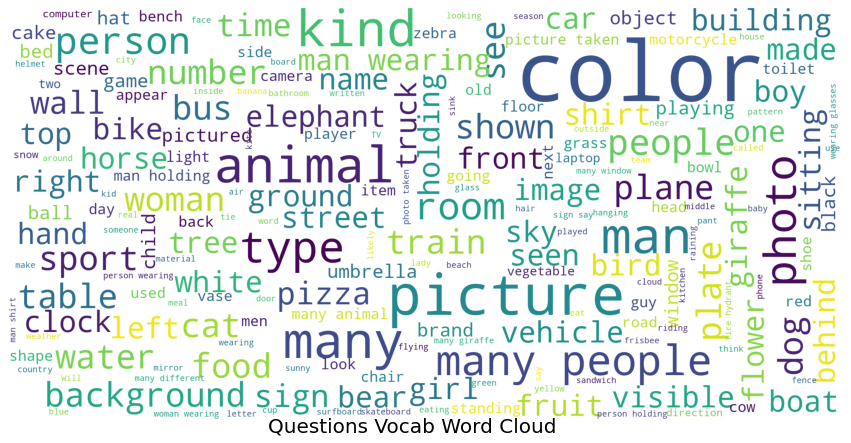

In [53]:
show_wordcloud(clWords, title = 'Questions Vocab Word Cloud')

# Answers

In [58]:
cdAnswerFreq= defaultdict(int)
for sAnswer in list(map(itemgetter('ans'), tTrainData)):
    cdAnswerFreq[sAnswer] += 1

cdSortedFreq = sorted(cdAnswerFreq.items(), key=itemgetter(1), reverse=True)[0: 1000]
ctTopAnswers, ctTopFreq = zip(*cdSortedFreq)

In [59]:
print('There are total ', len(cdAnswerFreq), ' different types of answers.')

There are total  22531  different types of answers.


C:\Users\vbui\Documents\applications\anaconda\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


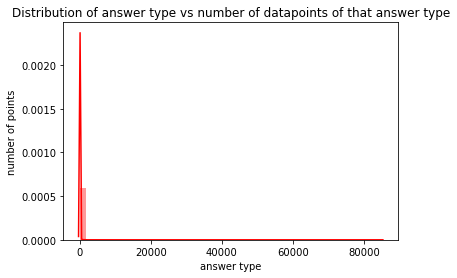

In [60]:
sns.distplot(list(cdAnswerFreq.values()), color='red')
plt.title('Distribution of answer type vs number of datapoints of that answer type')
plt.xlabel('answer type')
plt.ylabel('number of points')
plt.show()

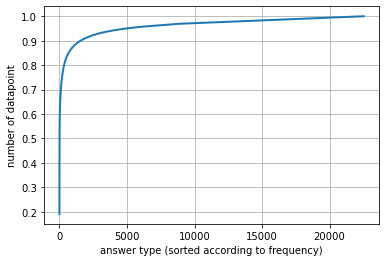

In [64]:
caAnswerCount = sorted(list(cdAnswerFreq.values()), reverse=True) / np.sum(list(cdAnswerFreq.values()));
caAnswerCountCum = np.cumsum(caAnswerCount)
plt.figure(1, figsize=(6, 4))
plt.clf()
plt.plot(caAnswerCountCum, linewidth=2)
plt.axis('tight')
plt.grid()
plt.xlabel('answer type (sorted according to frequency)')
plt.ylabel('number of datapoint')
plt.show()

In [63]:
type(answer_count)

numpy.ndarray

In [66]:
threshold = 0.875
clIdx = [iIdx for iIdx, iFreq in enumerate(caAnswerCountCum) if iFreq > threshold][0]
print(f'Top {clIdx + 1} answer-type covers about {threshold * 100}% of our train data')

Top 1005 answer-type covers about 87.5% of our train data


In [67]:
x = PrettyTable()
x = PrettyTable(["Answer Type", "Answer Count", "Coverage(%)"])

for iC in range(10):
    clRow = []
    clRow.append(ctTopAnswers[iC])
    clRow.append(ctTopFreq[iC])
    clRow.append(np.round((ctTopFreq[iC]/sum(ctTopFreq))*100, 2))
    x.add_row(clRow)

print(x)

+-------------+--------------+-------------+
| Answer Type | Answer Count | Coverage(%) |
+-------------+--------------+-------------+
|     yes     |    84978     |    21.89    |
|      no     |    82516     |    21.26    |
|      1      |    12540     |     3.23    |
|      2      |    12215     |     3.15    |
|    white    |     8916     |     2.3     |
|      3      |     6536     |     1.68    |
|     blue    |     5455     |     1.41    |
|     red     |     5201     |     1.34    |
|    black    |     5066     |     1.31    |
|      0      |     4977     |     1.28    |
+-------------+--------------+-------------+
